In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pandas as pd
import plotly.graph_objs as go
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

## 1. Data Understanding

### 1.1 Explore File Path

In [6]:
# Load dataset directories

dataset_path = '../dogImages'

dataset = os.listdir(dataset_path)
dataset

['test', 'train', 'valid']

Publisher had splitted the dataset into Train, Valid, Test

In [7]:
# Access Train, Val, Split dir

train_path = dataset_path + f'/{dataset[1]}'
val_path = dataset_path + f'/{dataset[2]}'
test_path = dataset_path + f'/{dataset[0]}'

train_dir = os.listdir(train_path)
val_dir = os.listdir(val_path)
test_dir = os.listdir(test_path)

### 1.2 Explore Number of Class

In [5]:
# Ensure the classes(files) in train, val, split folders are the same

print(f'Number of files/classes in train dir: {len(train_dir)}')
print(f'Number of files/classes in val dir: {len(val_dir)}')
print(f'Number of files/classes in test dir: {len(test_dir)}')

Number of files/classes in train dir: 133
Number of files/classes in val dir: 133
Number of files/classes in test dir: 133


In [6]:
# Show sample classes
for file in train_dir:
    print(file)

001.Affenpinscher
002.Afghan_hound
003.Airedale_terrier
004.Akita
005.Alaskan_malamute
006.American_eskimo_dog
007.American_foxhound
008.American_staffordshire_terrier
009.American_water_spaniel
010.Anatolian_shepherd_dog
011.Australian_cattle_dog
012.Australian_shepherd
013.Australian_terrier
014.Basenji
015.Basset_hound
016.Beagle
017.Bearded_collie
018.Beauceron
019.Bedlington_terrier
020.Belgian_malinois
021.Belgian_sheepdog
022.Belgian_tervuren
023.Bernese_mountain_dog
024.Bichon_frise
025.Black_and_tan_coonhound
026.Black_russian_terrier
027.Bloodhound
028.Bluetick_coonhound
029.Border_collie
030.Border_terrier
031.Borzoi
032.Boston_terrier
033.Bouvier_des_flandres
034.Boxer
035.Boykin_spaniel
036.Briard
037.Brittany
038.Brussels_griffon
039.Bull_terrier
040.Bulldog
041.Bullmastiff
042.Cairn_terrier
043.Canaan_dog
044.Cane_corso
045.Cardigan_welsh_corgi
046.Cavalier_king_charles_spaniel
047.Chesapeake_bay_retriever
048.Chihuahua
049.Chinese_crested
050.Chinese_shar-pei
051.Chow_c

### 1.3 Explore Class Distribution in each Split

In [7]:
# function for storing each class counts of a dir
def store_class_count(dir,path):
    class_counts = {}
    for class_dir in dir:
        class_path = os.path.join(path, class_dir)
        num_files = len(os.listdir(class_path))
        class_counts[class_dir] = num_files

    return class_counts

In [8]:
train_class_count = store_class_count(train_dir,train_path)
val_class_count = store_class_count(val_dir,val_path)
test_class_count = store_class_count(test_dir,test_path)

In [9]:
# Combine class counts from all datasets
all_class = {}

# Function to combine class counts from each dataset
def combine_class_counts(split_type, class_counts):
    for dog_class, count in class_counts.items():
        if dog_class not in all_class:
            all_class[dog_class] = {split_type: count}
        else:
            all_class[dog_class][split_type] = count

combine_class_counts("Train", train_class_count)
combine_class_counts("Validation", val_class_count)
combine_class_counts("Test", test_class_count)

# Extract class names and counts for each split
class_names = list(all_class.keys())

train_counts = [all_class[class_name].get("Train", 0) for class_name in class_names]
val_counts = [all_class[class_name].get("Validation", 0) for class_name in class_names]
test_counts = [all_class[class_name].get("Test", 0) for class_name in class_names]

# Create traces for each dataset
trace_train = go.Bar(x=class_names, y=train_counts, name='Train', marker_color='skyblue')
trace_val = go.Bar(x=class_names, y=val_counts, name='Validation', marker_color='orange')
trace_test = go.Bar(x=class_names, y=test_counts, name='Test', marker_color='green')

# Create layout
layout = go.Layout(
    title='Class Distribution Across Train, Validation, and Test Datasets',
    xaxis=dict(title='Dog Breeds'),
    yaxis=dict(title='Number of Images'),
    barmode='group',
    bargap=0.15,
    bargroupgap=0.1,
)

# Create figure
fig = go.Figure(data=[trace_train, trace_val, trace_test], layout=layout)

# Show figure
fig.show()

In [29]:
# Convert all_class dictionary to DataFrame
df = pd.DataFrame(all_class).T.fillna(0)

# Calculate total counts for each class
df['Total'] = df.sum(axis=1)

# Calculate percentages for each split
df['Train (%)'] = (df['Train'] / df['Total']) * 100
df['Validation (%)'] = (df['Validation'] / df['Total']) * 100
df['Test (%)'] = (df['Test'] / df['Total']) * 100

# Calculate average percentages across all classes
avg_train_percentage = df['Train (%)'].mean()
avg_validation_percentage = df['Validation (%)'].mean()
avg_test_percentage = df['Test (%)'].mean()

# Append a new row to the DataFrame with average percentages
df.loc['Average'] = [df['Train'].mean(), df['Validation'].mean(), df['Test'].mean(), df['Total'].mean(),
                     avg_train_percentage, avg_validation_percentage, avg_test_percentage]

# Display DataFrame
display(df)


,Train,Validation,Test,Total,Train (%),Validation (%),Test (%)
001.Affenpinscher,64.000000,8.000000,8.000000,80.000000,80.000000,10.000000,10.000000
002.Afghan_hound,58.000000,7.000000,8.000000,73.000000,79.452055,9.589041,10.958904
003.Airedale_terrier,52.000000,7.000000,6.000000,65.000000,80.000000,10.769231,9.230769
004.Akita,63.000000,8.000000,8.000000,79.000000,79.746835,10.126582,10.126582
005.Alaskan_malamute,77.000000,9.000000,10.000000,96.000000,80.208333,9.375000,10.416667
...,...,...,...,...,...,...,...
130.Welsh_springer_spaniel,44.000000,6.000000,5.000000,55.000000,80.000000,10.909091,9.090909
131.Wirehaired_pointing_griffon,30.000000,4.000000,3.000000,37.000000,81.081081,10.810811,8.108108
132.Xoloitzcuintli,26.000000,4.000000,3.000000,33.000000,78.787879,12.121212,9.090909
133.Yorkshire_terrier,30.000000,4.000000,4.000000,38.000000,78.947368,10.526316,10.526316


The Ratio of the Image Counts on Train, Validation, Test for each class is 8:1:1 respectively.

### 1.4 Visualize Sample Images

In [60]:
def visualize_random_classes(data_dir, split, class_names, num_classes=5, num_samples=5):
    random_classes = random.sample(class_names, num_classes)
    plt.figure(figsize=(15, 15))
    for i, class_name in enumerate(random_classes):
        dog_name = class_name.split('.')[1]
        class_dir = os.path.join(data_dir, split, class_name)
        images_list = os.listdir(class_dir)
        if len(images_list) < num_samples:
            num_samples = len(images_list)
        sample_images = random.sample(images_list, num_samples)
        for j, image_name in enumerate(sample_images):
            plt.subplot(num_classes, num_samples, i * num_samples + j + 1)
            img_path = os.path.join(class_dir, image_name)
            img = mpimg.imread(img_path)
            plt.imshow(img)
            plt.title(dog_name)
            plt.axis('on')
            #plt.grid(True)
    plt.suptitle(f'Sample Images from Random Classes in {split} Set', fontsize=16)
    plt.show()

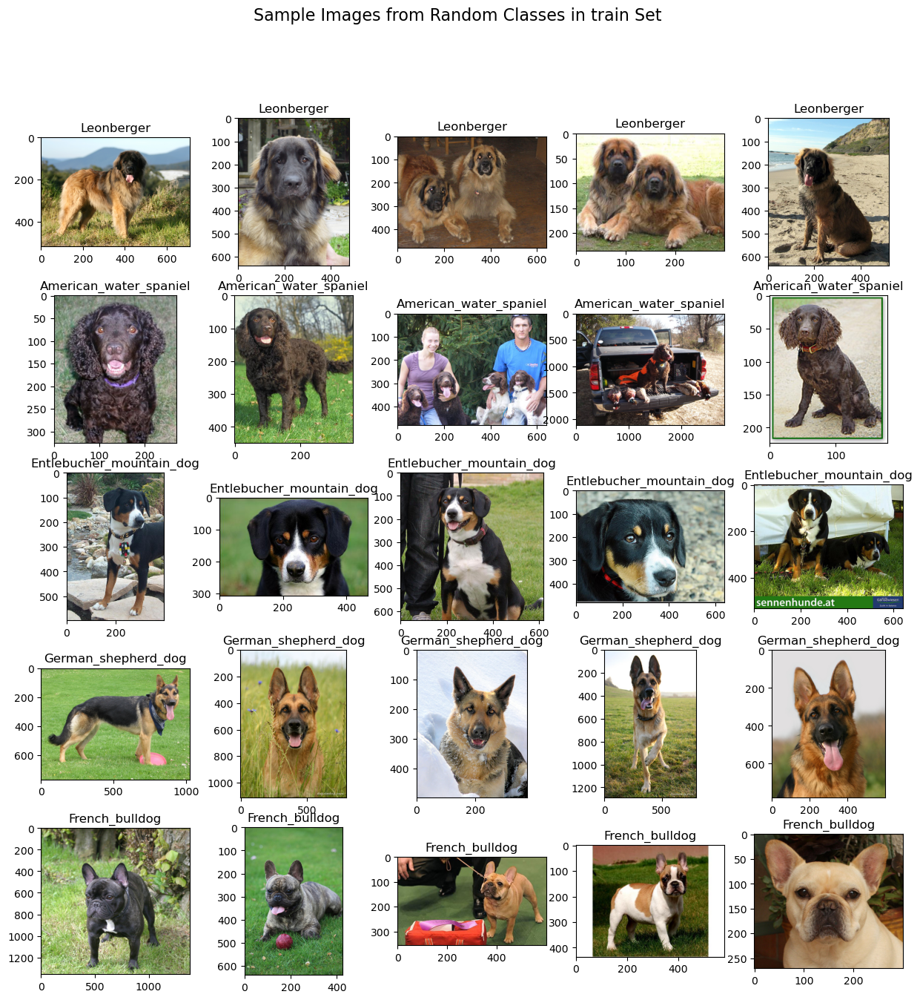

In [61]:
# Visualize sample images for each split
visualize_random_classes(dataset_path, dataset[1], class_names)

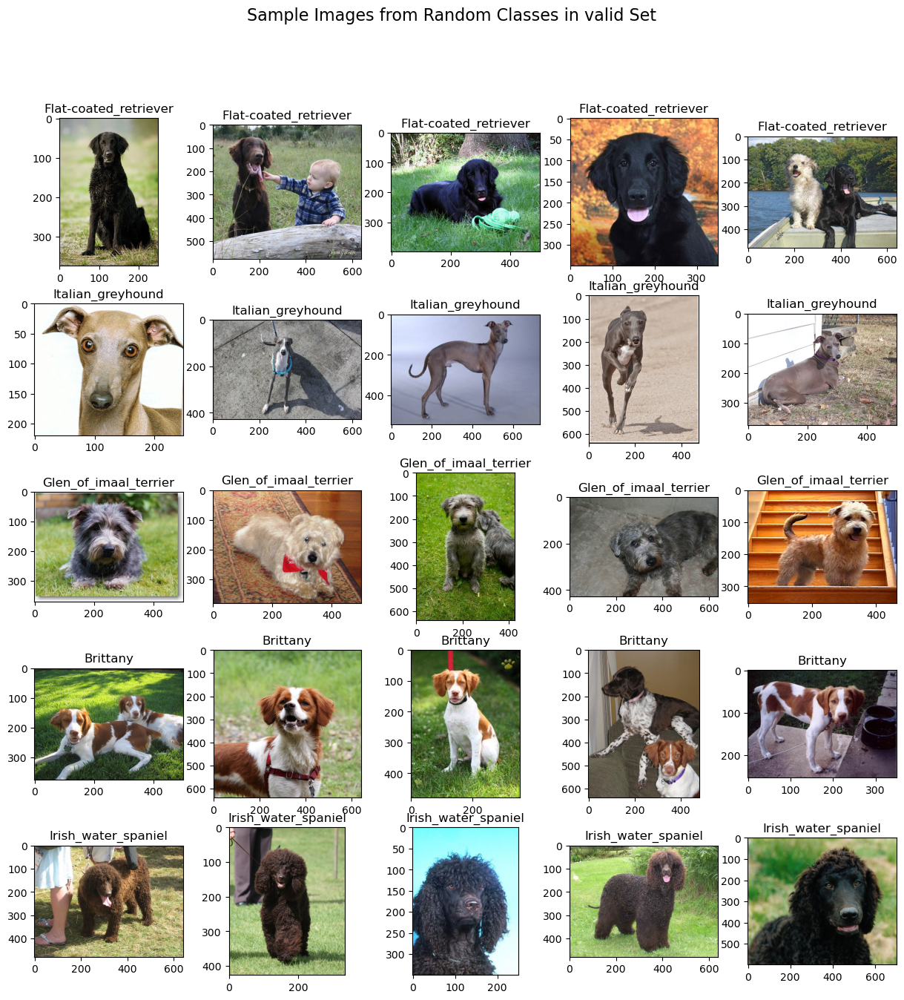

In [63]:
visualize_random_classes(dataset_path, dataset[2], class_names)

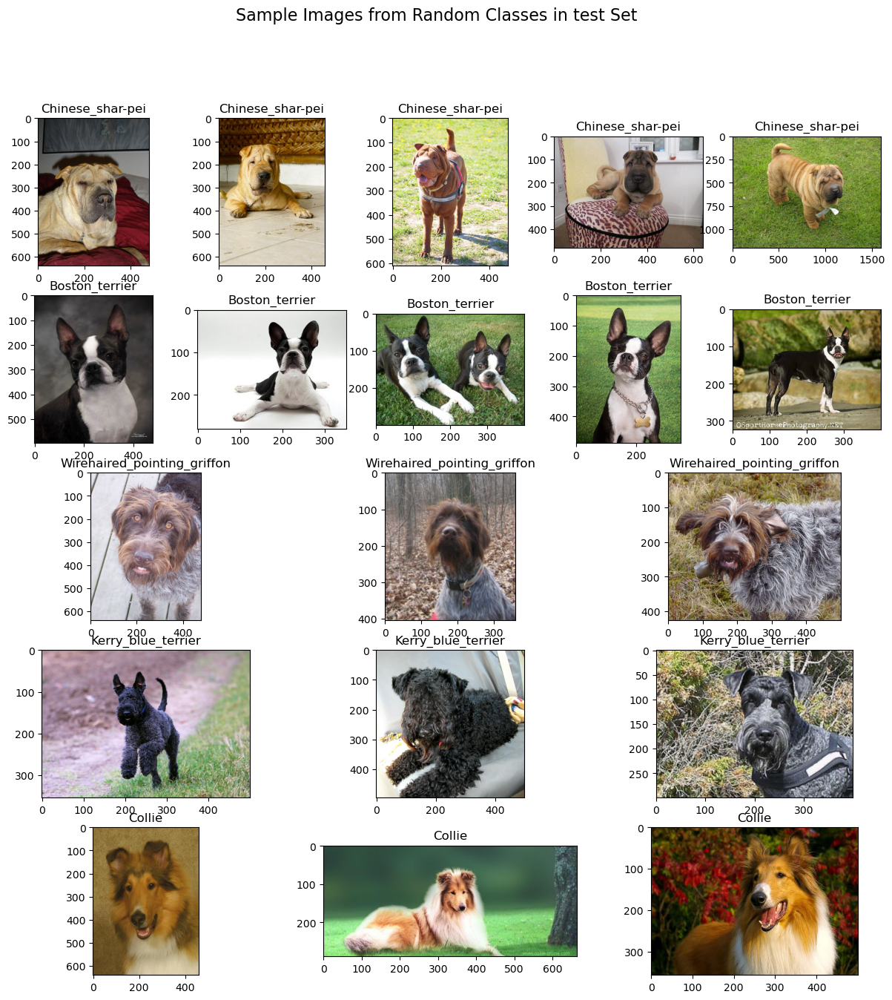

In [64]:
visualize_random_classes(dataset_path, dataset[0], class_names)

### 1.5 Explore Images Properties

In [10]:
img_size_list = []

def store_imgs_size_into_list(split_path, img_size_list):
    for dog_class in os.listdir(split_path):
        dog_class_path = os.path.join(split_path,dog_class)
        for img in os.listdir(dog_class_path):
            dog_img_path = os.path.join(dog_class_path,img)
            dog_img = Image.open(dog_img_path)
            width, height = dog_img.size
            img_size = f"{width} x {height}"
            if img_size in img_size_list:
                continue
            else:
                img_size_list.append(img_size)

In [8]:
store_imgs_size_into_list(train_path, img_size_list)
store_imgs_size_into_list(val_path, img_size_list)
store_imgs_size_into_list(test_path, img_size_list)

In [9]:
# display sample image size (first 20 samples)
for size in img_size_list[:20]:
    print(size)

400 x 300
480 x 360
321 x 316
500 x 375
360 x 270
300 x 225
355 x 360
348 x 400
265 x 265
500 x 449
500 x 333
596 x 600
396 x 640
640 x 514
270 x 287
1006 x 954
400 x 341
640 x 429
410 x 303
427 x 640


## 2. Data Pre-processing

### 2.1 Image Resizing

Resize all the images to 150 x150

In [6]:
preprocessed_dataset_path = "../dogImages_preprocessed"

In [21]:
# function to resize images of the original dataset and create another dir to stored the preprocessed images
def resize_imgs(dataset_path, target_size, output_dir):
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    for split_file in os.listdir(dataset_path):
        split_file_path = os.path.join(dataset_path, split_file)
        for dog_class in os.listdir(split_file_path):
            dog_class_path = os.path.join(split_file_path, dog_class)
            for dog_img in os.listdir(dog_class_path):
                dog_img_path = os.path.join(dog_class_path, dog_img)
                
                try:
                    # Open the image and resize it
                    img = Image.open(dog_img_path)
                    resized_image = img.resize(target_size, Image.ANTIALIAS)
                    
                    # Save the resized image to the output directory
                    output_img_path = os.path.join(output_dir, split_file, dog_class)
                    os.makedirs(output_img_path, exist_ok=True)
                    output_img_path = os.path.join(output_img_path, dog_img)
                    resized_image.save(output_img_path)
                    
                except Exception as e:
                    print(f"Error processing {dog_img_path}: {str(e)}")

In [22]:
target_size = (150, 150)
output_dir = preprocessed_dataset_path

resize_imgs(dataset_path, target_size, output_dir)

In [23]:
train_preprocessed_path = f'{preprocessed_dataset_path}/train'
val_preprocessed_path = f'{preprocessed_dataset_path}/valid'
test_preprocessed_path = f'{preprocessed_dataset_path}/test'

In [24]:
img_size_preprocessed_list = []

store_imgs_size_into_list(train_preprocessed_path,img_size_preprocessed_list)
store_imgs_size_into_list(val_preprocessed_path,img_size_preprocessed_list)
store_imgs_size_into_list(test_preprocessed_path,img_size_preprocessed_list)

In [25]:
for img_size in img_size_preprocessed_list:
    print(img_size)

150 x 150


### 2.2 Image Augmentation

Data Augmentation Techniques: rotation, translation, flipping

In [26]:
image_rotation_list = []
image_translation_list = []
image_flipped_list = []

In [27]:
# function for data augmentation

def image_augmenting(dataset_path):
    # Define the augmentation parameters
    rotation_angle = 10  # Maximum rotation angle in degrees
    max_translation = 20  # Maximum translation in pixels

    for split_file in os.listdir(dataset_path):
        if split_file == 'train':
            split_file_path = os.path.join(dataset_path, split_file)
            for dog_class in os.listdir(split_file_path):
                dog_class_path = os.path.join(split_file_path, dog_class)
                for dog_img in os.listdir(dog_class_path):
                    dog_img_path = os.path.join(dog_class_path, dog_img)
                    
                    try:
                        img = Image.open(dog_img_path)
                        file_name = os.path.splitext(dog_img)[0]
                        
                        # Apply random rotation
                        rotation_angle_rand = random.uniform(-rotation_angle, rotation_angle)
                        rotated_image = img.rotate(rotation_angle_rand, resample=Image.BICUBIC, expand=True)

                        rotated_img_path = os.path.join(dataset_path, split_file, dog_class, f'{file_name}_rotated.jpg')
                        rotated_image.save(rotated_img_path)
                        image_rotation_list.append(rotated_img_path)
                        
                        # Apply random translation
                        translation_x = random.randint(-max_translation, max_translation)
                        translation_y = random.randint(-max_translation, max_translation)
                        translated_image = img.transform(
                            rotated_image.size,
                            Image.AFFINE,
                            (1, 0, translation_x, 0, 1, translation_y),
                            resample=Image.BICUBIC
                        )
        
                        translated_img_path = os.path.join(dataset_path, split_file, dog_class, f'{file_name}_translated.jpg')
                        translated_image.save(translated_img_path)
                        image_translation_list.append(translated_img_path)
                        
                        # Horizontal flip the image
                        flipped_image = img.transpose(Image.FLIP_LEFT_RIGHT)
                    
                        flipped_img_path = os.path.join(dataset_path, split_file, dog_class, f'{file_name}_flipped.jpg')
                        flipped_image.save(flipped_img_path)
                        image_flipped_list.append(flipped_img_path)
                        
                    except Exception as e:
                        print(f"Error processing {dog_img_path}: {str(e)}")

In [28]:
image_augmenting(preprocessed_dataset_path)

In [16]:
def display_random_images(image_list, num_images=15):
    random_image_paths = random.sample(image_list, num_images)
    
    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    for i, image_path in enumerate(random_image_paths):
        row = i // 5
        col = i % 5
        image = Image.open(image_path)
        axes[row, col].imshow(image)
        axes[row, col].axis('off')
    plt.tight_layout()
    plt.show()

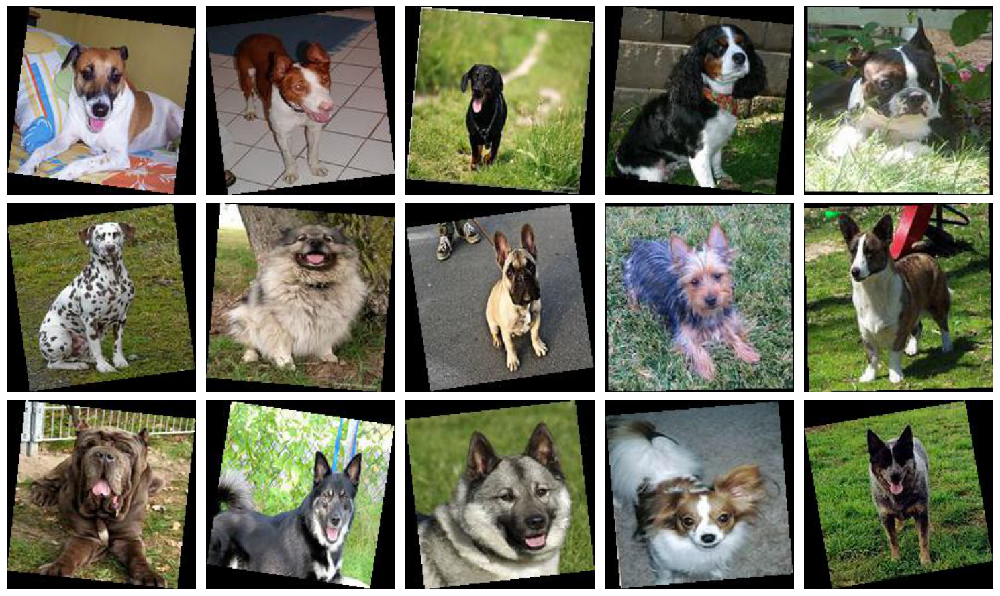

In [29]:
display_random_images(image_rotation_list)

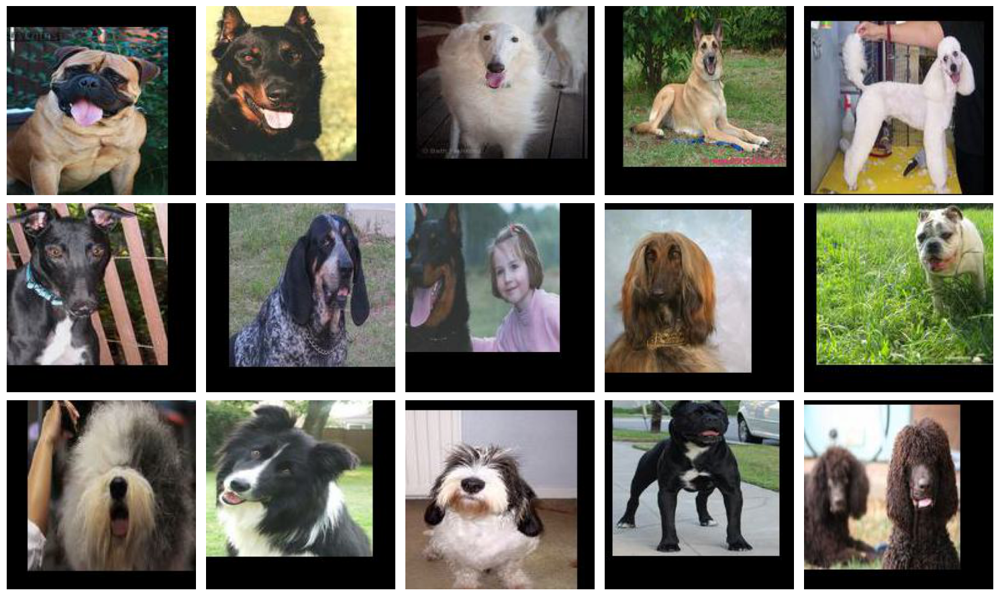

In [30]:
display_random_images(image_translation_list)

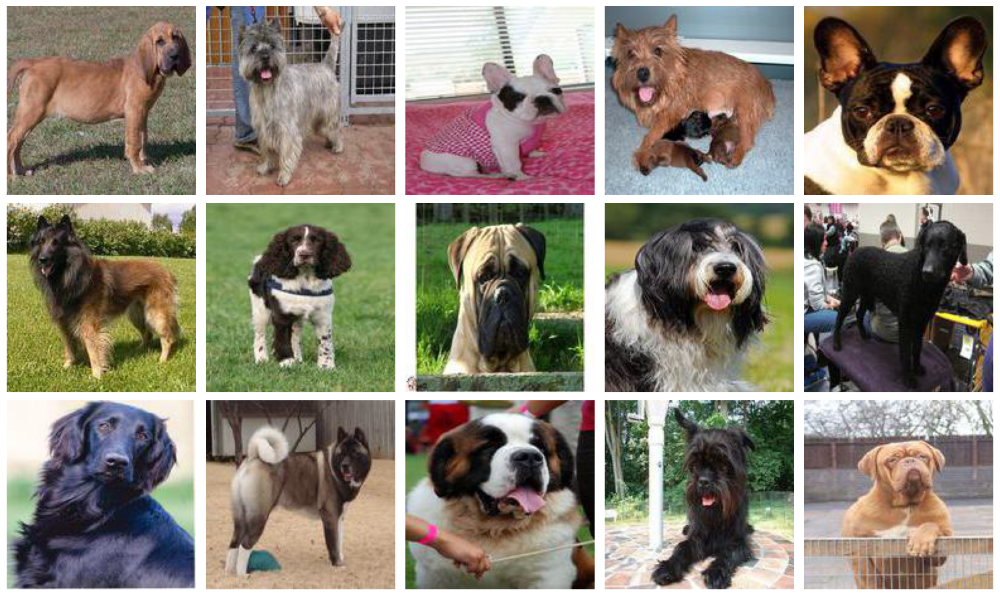

In [31]:
display_random_images(image_flipped_list)

In [32]:
# resize again (for train set), as data augmentation will affect the size 
    
target_size = (150,150)

for split_file in os.listdir(preprocessed_dataset_path):
    if split_file == 'train':
        split_file_path = os.path.join(preprocessed_dataset_path, split_file)
        for dog_class in os.listdir(split_file_path):
            dog_class_path = os.path.join(split_file_path, dog_class)
            for dog_img in os.listdir(dog_class_path):
                dog_img_path = os.path.join(dog_class_path, dog_img)
                
                try:
                    # Open the image and resize it
                    img = Image.open(dog_img_path)
                    resized_image = img.resize(target_size, Image.ANTIALIAS)
                    
                    resized_image.save(dog_img_path)
                    
                except Exception as e:
                    print(f"Error processing {dog_img_path}: {str(e)}")

### 2.3 Data Vectorization and Normalization

In [22]:
def vectorize_image(image_path):
    # Load the image and flatten it into a one-dimensional array
    img = Image.open(image_path)
    img_array = np.array(img)
    flattened_img = img_array.flatten()
    return flattened_img

def normalize_image(img):
    # Normalize pixel values to the range [0, 1]
    normalized_img = img / 255.0

    return normalized_img

In [23]:
# Initialize lists to store image data and labels
X_train, y_train = [], []
X_val, y_val = [], []
X_test, y_test = [], []

In [24]:
# Initialize a label encoder to convert class names into numerical labels
label_encoder = LabelEncoder()

# Iterate through the directories of each set (train, val, test)
for set_name in ["train", "valid", "test"]:
    set_dir = os.path.join(preprocessed_dataset_path, set_name)
    
    # Iterate through the subdirectories (each subdirectory represents a class)
    for class_name in os.listdir(set_dir):
        class_dir = os.path.join(set_dir, class_name)
        
        # Iterate through the images in the class directory
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            
            # Vectorize the image and store it in the list
            flattened_img = vectorize_image(img_path)

            # Normalize the image
            normalized_img = normalize_image(flattened_img)

            # Append the image and label to the lists
            if set_name == "train":
                X_train.append(normalized_img)
                y_train.append(class_name)  
            elif set_name == "valid":
                X_val.append(normalized_img)
                y_val.append(class_name)  
            elif set_name == "test":
                X_test.append(normalized_img)
                y_test.append(class_name)  

In [25]:
# convert list to numpy array
X_train_np = np.array(X_train, dtype='float32')
X_val_np = np.array(X_val, dtype='float32')
X_test_np = np.array(X_test, dtype='float32')

In [26]:
print(X_train_np)

[[0.20784314 0.31764707 0.15686275 ... 0.8627451  0.7490196  0.7176471 ]
 [0.14901961 0.18039216 0.03529412 ... 0.89411765 0.74509805 0.70980394]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.42745098 0.3764706  0.40392157 ... 0.7921569  0.7137255  0.61960787]
 [0.01568628 0.01568628 0.00784314 ... 0.00784314 0.00784314 0.00784314]
 [0.36078432 0.35686275 0.34117648 ... 0.         0.         0.        ]]


- X set values have been vectorized images from 2d to 1d, and stored into (No of samples, features (height x width x channels)) np array format
- The values have been normalized between 0 to 1

In [27]:
# Encode class labels into numerical format
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Convert numerical class labels to categorical format
num_classes = len(np.unique(y_train))
y_train_categorical = to_categorical(y_train_encoded, num_classes=num_classes)
y_val_categorical = to_categorical(y_val_encoded, num_classes=num_classes)
y_test_categorical = to_categorical(y_test_encoded, num_classes=num_classes)

In [28]:
print(y_train_encoded,'\n')
print(y_train_categorical)

[ 0  0  0 ... 79 79 79] 

[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]


In [29]:
# Print the shapes of the arrays
print("X_train shape:", X_train_np.shape)
print("y_train_categorical shape:", y_train_categorical.shape)
print("X_val shape:", X_val_np.shape)
print("y_val_categorical shape:", y_val_categorical.shape)
print("X_test shape:", X_test_np.shape)
print("y_test_categorical shape:", y_test_categorical.shape)

X_train shape: (17576, 67500)
y_train_categorical shape: (17576, 80)
X_val shape: (543, 67500)
y_val_categorical shape: (543, 80)
X_test shape: (558, 67500)
y_test_categorical shape: (558, 80)


## 3. Model Development

In [3]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras import initializers
from keras import regularizers
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from keras import layers
from keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from keras.wrappers.scikit_learn import KerasClassifier
from kerastuner.tuners import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy.stats import uniform, randint
import tensorflow as tf
import keras

In [4]:
# Disable GPU usage
tf.config.set_visible_devices([], 'GPU')

In [6]:
print(tf.config.list_physical_devices())

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [19]:
def visualize_history_metrics(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1,len(acc)+1)
    
    # Creating subplots
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(7,3))
    
    axes[0].plot(epochs, acc,'b',label='Train Accuracy')
    axes[0].plot(epochs, val_acc,'r',label='Test Accuracy')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()
    
    axes[1].plot(epochs, loss,'b',label='Train Loss')
    axes[1].plot(epochs, val_loss,'r',label='Test Loss')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()
    
    # Adjusting layout for better spacing
    plt.tight_layout()
    
    # Display the figure
    plt.show()

def evaluate_model(model, X_test, y_test_categorical, num_classes=80):
    # Predict probabilities for test set
    predict_X = model.predict(X_test)
    
    # Convert probabilities to class labels
    predict_labels = np.argmax(predict_X, axis=1)
    y_test_labels = np.argmax(y_test_categorical, axis=1)
    
    # # Generate classification report
    # target_names = ["Class {}".format(i) for i in range(num_classes)]
    # print(classification_report(y_test_labels, predict_labels, target_names=target_names))

    precision = precision_score(y_test_labels, predict_labels, average='weighted')
    recall = recall_score(y_test_labels, predict_labels, average='weighted')
    f1 = f1_score(y_test_labels, predict_labels, average='weighted')
    accuracy = accuracy_score(y_test_labels, predict_labels)

    # Print the metrics
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-score:", f1)
    print("Accuracy:", accuracy)

# def evaluate_model_cnn(model, validation_ds):
#     true_labels = []
#     for images, labels in validation_ds:
#         true_labels.extend(labels.numpy())

#     predictions = model.predict(validation_ds)
#     predicted_labels = tf.argmax(predictions, axis=1)

#     print(classification_report(true_labels, predicted_labels))

def evaluate_model_cnn(model, validation_ds):
    # Initialize lists to store true and predicted labels
    true_labels = []
    predicted_labels = []
    
    # Iterate over the validation dataset and make predictions
    for images, labels in validation_ds:
        predictions = model.predict(images)
        predicted_labels.extend(np.argmax(predictions, axis=1))
        true_labels.extend(labels.numpy())

    # Convert lists to numpy arrays
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)

    # Calculate precision, recall, and F1-score
    precision = precision_score(true_labels, predicted_labels, average='weighted')
    recall = recall_score(true_labels, predicted_labels, average='weighted')
    f1 = f1_score(true_labels, predicted_labels, average='weighted')
    accuracy = accuracy_score(true_labels, predicted_labels)

    # Print the metrics
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-score:", f1)
    print("Accuracy:", accuracy)

def evaluate_average_metrics(history):
    # Compute average training and validation accuracy
    avg_train_accuracy = sum(history.history['accuracy']) / len(history.history['accuracy'])
    avg_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])

    # Compute average training and validation loss
    avg_train_loss = sum(history.history['loss']) / len(history.history['loss'])
    avg_val_loss = sum(history.history['val_loss']) / len(history.history['val_loss'])

    # Print the summary
    print("Average Training Accuracy:", avg_train_accuracy)
    print("Average Validation Accuracy:", avg_val_accuracy)
    print("Average Training Loss:", avg_train_loss)
    print("Average Validation Loss:", avg_val_loss)

In [16]:
features = 67500
classes = 80

early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, verbose=1)

### 3.1 DNN

- DNN Base Model

In [32]:
# Create the DNN model
model_dnn1 = Sequential()
model_dnn1.add(Dense(32, input_dim=features, activation='relu'))
model_dnn1.add(Dense(64, activation='relu'))
model_dnn1.add(Dense(128, activation='relu'))
model_dnn1.add(Dense(classes, activation='softmax'))

model_dnn1.compile(loss = 'categorical_crossentropy', metrics = 'accuracy', optimizer = 'adam')

In [33]:
history_dnn1 = model_dnn1.fit(X_train_np, y_train_categorical, epochs = 50, batch_size = 128, 
                         validation_data = (X_test_np, y_test_categorical),
                         callbacks=[early_stopping])

Epoch 1/50
138/138 [==============================] - 4s 26ms/step - loss: 4.4846 - accuracy: 0.0149 - val_loss: 4.3713 - val_accuracy: 0.0179
Epoch 2/50
138/138 [==============================] - 3s 25ms/step - loss: 4.3685 - accuracy: 0.0175 - val_loss: 4.3605 - val_accuracy: 0.0179
Epoch 3/50
138/138 [==============================] - 3s 25ms/step - loss: 4.3658 - accuracy: 0.0170 - val_loss: 4.3598 - val_accuracy: 0.0179
Epoch 4/50
138/138 [==============================] - 3s 24ms/step - loss: 4.3655 - accuracy: 0.0160 - val_loss: 4.3597 - val_accuracy: 0.0179
Epoch 5/50
138/138 [==============================] - 3s 24ms/step - loss: 4.3654 - accuracy: 0.0175 - val_loss: 4.3595 - val_accuracy: 0.0179
Epoch 6/50
138/138 [==============================] - 3s 24ms/step - loss: 4.3653 - accuracy: 0.0164 - val_loss: 4.3597 - val_accuracy: 0.0179
Epoch 7/50
138/138 [==============================] - 3s 24ms/step - loss: 4.3652 - accuracy: 0.0175 - val_loss: 4.3596 - val_accuracy: 0.0179

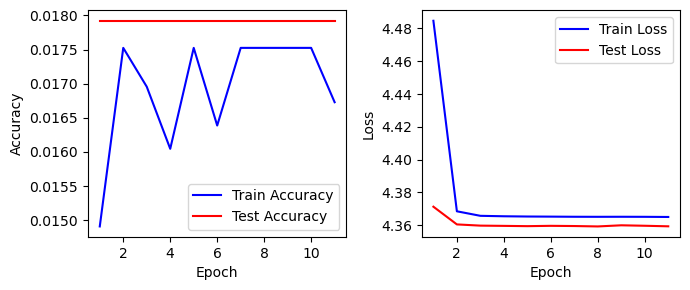

In [34]:
visualize_history_metrics(history_dnn1)

In [36]:
evaluate_model(model_dnn1,X_test_np,y_test_categorical)

 1/18 [>.............................] - ETA: 0s

18/18 [==============================] - 0s 6ms/step
Precision: 0.0003211675081255379
Recall: 0.017921146953405017
F1-score: 0.000631026301176233
Accuracy: 0.017921146953405017


- DNN Manual Improvement

In [43]:
# Create the DNN model
model_dnn2 = Sequential()

model_dnn2.add(Dense(64, input_dim=features, activation='relu'))
model_dnn2.add(BatchNormalization())
model_dnn2.add(Dropout(0.5))

model_dnn2.add(Dense(64, input_dim=features, activation='relu'))
model_dnn2.add(BatchNormalization())
model_dnn2.add(Dropout(0.5))

model_dnn2.add(Dense(128, activation='relu'))
model_dnn2.add(BatchNormalization())
model_dnn2.add(Dropout(0.5))

model_dnn2.add(Dense(128, activation='relu'))
model_dnn2.add(BatchNormalization())
model_dnn2.add(Dropout(0.5))

model_dnn2.add(Dense(classes, activation='softmax'))

model_dnn2.compile(loss = 'categorical_crossentropy', metrics = ['accuracy'], optimizer = 'adam')

In [44]:
history_dnn2 = model_dnn2.fit(X_train_np, y_train_categorical, epochs = 50, batch_size = 128, 
                         validation_data = (X_test_np, y_test_categorical),
                         callbacks=[early_stopping])

Epoch 1/50
138/138 [==============================] - 9s 52ms/step - loss: 5.1232 - accuracy: 0.0141 - val_loss: 4.3517 - val_accuracy: 0.0215
Epoch 2/50
138/138 [==============================] - 7s 47ms/step - loss: 4.6790 - accuracy: 0.0199 - val_loss: 4.1500 - val_accuracy: 0.0323
Epoch 3/50
138/138 [==============================] - 7s 47ms/step - loss: 4.4562 - accuracy: 0.0266 - val_loss: 4.0810 - val_accuracy: 0.0341
Epoch 4/50
138/138 [==============================] - 7s 54ms/step - loss: 4.3306 - accuracy: 0.0288 - val_loss: 4.0739 - val_accuracy: 0.0376
Epoch 5/50
138/138 [==============================] - 8s 55ms/step - loss: 4.2483 - accuracy: 0.0321 - val_loss: 4.0589 - val_accuracy: 0.0448
Epoch 6/50
138/138 [==============================] - 7s 51ms/step - loss: 4.2009 - accuracy: 0.0337 - val_loss: 4.0720 - val_accuracy: 0.0502
Epoch 7/50
138/138 [==============================] - 7s 49ms/step - loss: 4.1771 - accuracy: 0.0350 - val_loss: 4.0174 - val_accuracy: 0.0484

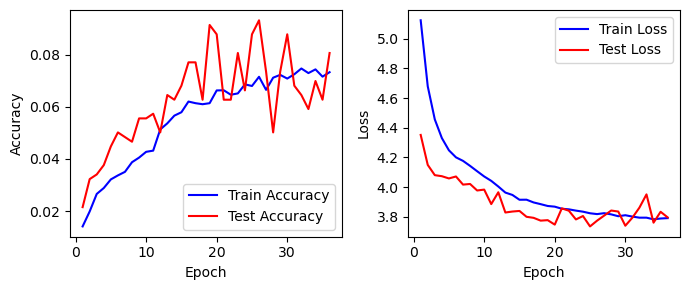

In [45]:
visualize_history_metrics(history_dnn2)

In [46]:
evaluate_model(model_dnn2,X_test_np,y_test_categorical)

18/18 [==============================] - 0s 8ms/step
Precision: 0.033478082818690025
Recall: 0.08064516129032258
F1-score: 0.03822364603998135
Accuracy: 0.08064516129032258


- DNN Hyperparameters Tuning 

In [30]:
# Function to create model
def build_model_dnn_tune(hp):
    model = keras.Sequential()
    model.add(layers.Dense(units=hp.Int('units',min_value=32,max_value=512,step=32), input_dim=features, 
                           activation=hp.Choice('activation_function', values=['relu', 'leaky_relu'])))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(rate=hp.Choice('dropout_rate', values=[0.2, 0.3, 0.4])))
    model.add(layers.Dense(units=hp.Int('units',min_value=32,max_value=512,step=32), 
                           activation=hp.Choice('activation_function', values=['relu', 'leaky_relu'])))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(rate=hp.Choice('dropout_rate', values=[0.2, 0.3, 0.4])))
    model.add(layers.Dense(units=hp.Int('units',min_value=32,max_value=512,step=32), 
                           activation=hp.Choice('activation_function', values=['relu', 'leaky_relu'])))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(rate=hp.Choice('dropout_rate', values=[0.2, 0.3, 0.4])))
    model.add(layers.Dense(units=hp.Int('units',min_value=32,max_value=512,step=32), 
                           activation=hp.Choice('activation_function', values=['relu', 'leaky_relu'])))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(rate=hp.Choice('dropout_rate', values=[0.2, 0.3, 0.4])))
    model.add(layers.Dense(classes, activation='sigmoid'))

    model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
    return model

# Instantiate the tuner
tuner_dnn = RandomSearch(
    build_model_dnn_tune,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=1,
    directory='dnn_hp_tuning',
    project_name='dnn_tuner')

# Perform the hyperparameter search
tuner_dnn.search(X_train_np, y_train_categorical,
             epochs=15,
             validation_data=(X_val_np, y_val_categorical))

best_hps_dnn = tuner_dnn.get_best_hyperparameters(num_trials=1)[0]

Trial 10 Complete [00h 12m 49s]
val_accuracy: 0.09944751113653183

Best val_accuracy So Far: 0.09944751113653183
Total elapsed time: 01h 34m 14s
INFO:tensorflow:Oracle triggered exit


In [32]:
model_dnn3 = tuner_dnn.hypermodel.build(best_hps_dnn)

# Train the model
hisotry_dnn3 = model_dnn3.fit(X_train_np, y_train_categorical, 
                              epochs=50,
                              validation_data=(X_val_np,y_val_categorical),
                              callbacks=[early_stopping])

Epoch 1/50
550/550 [==============================] - 25s 41ms/step - loss: 4.4835 - accuracy: 0.0314 - val_loss: 4.1125 - val_accuracy: 0.0350
Epoch 2/50
550/550 [==============================] - 21s 38ms/step - loss: 4.0760 - accuracy: 0.0516 - val_loss: 3.9414 - val_accuracy: 0.0626
Epoch 3/50
550/550 [==============================] - 21s 38ms/step - loss: 3.9231 - accuracy: 0.0636 - val_loss: 3.8859 - val_accuracy: 0.0755
Epoch 4/50
550/550 [==============================] - 21s 38ms/step - loss: 3.8546 - accuracy: 0.0696 - val_loss: 3.8777 - val_accuracy: 0.0737
Epoch 5/50
550/550 [==============================] - 21s 38ms/step - loss: 3.8067 - accuracy: 0.0780 - val_loss: 3.8623 - val_accuracy: 0.0755
Epoch 6/50
550/550 [==============================] - 23s 42ms/step - loss: 3.7668 - accuracy: 0.0838 - val_loss: 3.8798 - val_accuracy: 0.0921
Epoch 7/50
550/550 [==============================] - 22s 40ms/step - loss: 3.7205 - accuracy: 0.0921 - val_loss: 3.9038 - val_accuracy:

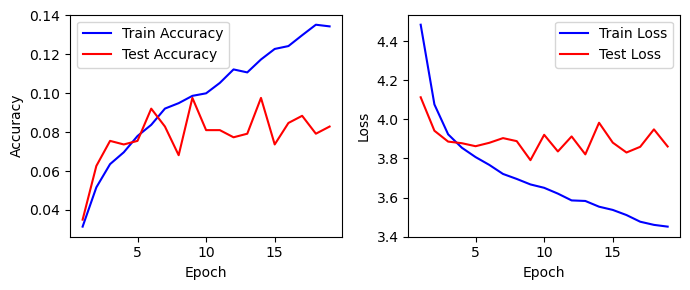

In [36]:
visualize_history_metrics(hisotry_dnn3)

In [39]:
evaluate_model(model_dnn3,X_test_np,y_test_categorical)

18/18 [==============================] - 1s 16ms/step
Precision: 0.06388308565358763
Recall: 0.07885304659498207
F1-score: 0.0608640722459243
Accuracy: 0.07885304659498207


### 3.2 CNN

In [4]:
tf.config.set_visible_devices([tf.config.list_physical_devices('GPU')[0]], 'GPU')

In [7]:
train_dir = f'{preprocessed_dataset_path}/train'
valid_dir = f'{preprocessed_dataset_path}/valid'
test_dir = f'{preprocessed_dataset_path}/test'

In [8]:
IMAGE_SIZE = (150, 150)
BATCH_SIZE = 32

In [9]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir,
  seed=123,
  image_size=IMAGE_SIZE,
  batch_size=BATCH_SIZE)

Found 17576 files belonging to 80 classes.


In [10]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  valid_dir,
  seed=123,
  image_size=IMAGE_SIZE,
  batch_size=BATCH_SIZE)

Found 543 files belonging to 80 classes.


In [11]:
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_dir,
  seed=123,
  image_size=IMAGE_SIZE,
  batch_size=BATCH_SIZE)

Found 558 files belonging to 80 classes.


In [12]:
class_names = train_ds.class_names
print(class_names)

['001.Affenpinscher', '002.Afghan_hound', '003.Airedale_terrier', '004.Akita', '005.Alaskan_malamute', '006.American_eskimo_dog', '007.American_foxhound', '008.American_staffordshire_terrier', '009.American_water_spaniel', '010.Anatolian_shepherd_dog', '011.Australian_cattle_dog', '012.Australian_shepherd', '013.Australian_terrier', '014.Basenji', '015.Basset_hound', '016.Beagle', '017.Bearded_collie', '018.Beauceron', '019.Bedlington_terrier', '020.Belgian_malinois', '021.Belgian_sheepdog', '022.Belgian_tervuren', '023.Bernese_mountain_dog', '024.Bichon_frise', '025.Black_and_tan_coonhound', '026.Black_russian_terrier', '027.Bloodhound', '028.Bluetick_coonhound', '029.Border_collie', '030.Border_terrier', '031.Borzoi', '032.Boston_terrier', '033.Bouvier_des_flandres', '034.Boxer', '035.Boykin_spaniel', '036.Briard', '037.Brittany', '038.Brussels_griffon', '039.Bull_terrier', '040.Bulldog', '041.Bullmastiff', '042.Cairn_terrier', '043.Canaan_dog', '044.Cane_corso', '045.Cardigan_welsh_

- CNN Base Model

In [33]:
# Initialize the model
model_cnn1 = Sequential()

# Add convolutional layers with max pooling
model_cnn1.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(150,150,3)))
model_cnn1.add(MaxPooling2D(2, 2))
model_cnn1.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model_cnn1.add(MaxPooling2D(2, 2))
model_cnn1.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model_cnn1.add(MaxPooling2D(2, 2))
model_cnn1.add(Conv2D(256, kernel_size=(3, 3), activation='relu'))
model_cnn1.add(MaxPooling2D(2, 2))

# Flatten the feature maps
model_cnn1.add(Flatten())

# Add dense layers with dropout for regularization
model_cnn1.add(Dense(1024, activation='relu'))
model_cnn1.add(Dropout(0.5))
model_cnn1.add(Dense(512, activation='relu'))
model_cnn1.add(Dropout(0.5))
model_cnn1.add(Dense(len(class_names), activation='softmax'))

model_cnn1.compile(loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'], optimizer = 'adam')

model_cnn1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_13 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [34]:
history_cnn1 = model_cnn1.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
550/550 [==============================] - 25s 42ms/step - loss: 4.7730 - accuracy: 0.0187 - val_loss: 4.2906 - val_accuracy: 0.0295
Epoch 2/50
550/550 [==============================] - 19s 35ms/step - loss: 4.1377 - accuracy: 0.0423 - val_loss: 4.0233 - val_accuracy: 0.0497
Epoch 3/50
550/550 [==============================] - 19s 34ms/step - loss: 3.9366 - accuracy: 0.0620 - val_loss: 3.8278 - val_accuracy: 0.0829
Epoch 4/50
550/550 [==============================] - 18s 33ms/step - loss: 3.7088 - accuracy: 0.0938 - val_loss: 3.6551 - val_accuracy: 0.1050
Epoch 5/50
550/550 [==============================] - 19s 34ms/step - loss: 3.4701 - accuracy: 0.1338 - val_loss: 3.5409 - val_accuracy: 0.1400
Epoch 6/50
550/550 [==============================] - 20s 36ms/step - loss: 3.2113 - accuracy: 0.1819 - val_loss: 3.4395 - val_accuracy: 0.1436
Epoch 7/50
550/550 [==============================] - 19s 34ms/step - loss: 2.9226 - accuracy: 0.2419 - val_loss: 3.5458 - val_accuracy:

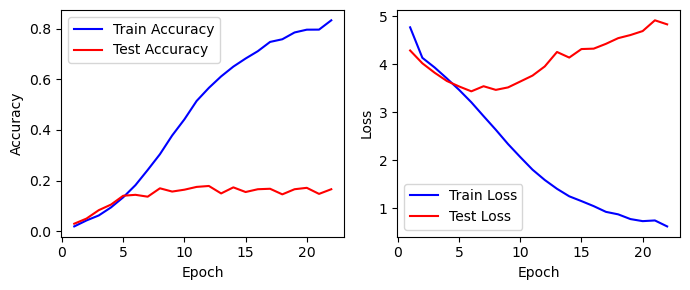

In [36]:
visualize_history_metrics(history_cnn1)

In [68]:
evaluate_model_cnn(model_cnn1, test_ds)

1/1 [==============================] - 0s 352ms/step
Precision: 0.18271081794959088
Recall: 0.1917562724014337
F1-score: 0.17389343101017923
Accuracy: 0.1917562724014337


- CNN Manual Improvement

In [42]:
model_cnn2 = Sequential()

# Convolutional layers with batch normalization and max pooling
model_cnn2.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(150,150,3)))
model_cnn2.add(BatchNormalization())
model_cnn2.add(MaxPooling2D(2, 2))

model_cnn2.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model_cnn2.add(BatchNormalization())
model_cnn2.add(MaxPooling2D(2, 2))

model_cnn2.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model_cnn2.add(BatchNormalization())
model_cnn2.add(MaxPooling2D(2, 2))

model_cnn2.add(Conv2D(256, kernel_size=(3, 3), activation='relu'))
model_cnn2.add(BatchNormalization())
model_cnn2.add(MaxPooling2D(2, 2))

model_cnn2.add(Conv2D(512, kernel_size=(3, 3), activation='relu'))
model_cnn2.add(BatchNormalization())
model_cnn2.add(MaxPooling2D(2, 2))

# Flatten the feature maps
model_cnn2.add(Flatten())

# Dense layers with dropout
model_cnn2.add(Dense(1024, activation='relu'))
model_cnn2.add(Dropout(0.5))

model_cnn2.add(Dense(512, activation='relu'))
model_cnn2.add(Dropout(0.5))

# Output layer
model_cnn2.add(Dense(len(class_names), activation='softmax'))

# Compile the model
model_cnn2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_cnn2.summary()


Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_90 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_83 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_73 (MaxPoolin  (None, 74, 74, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_91 (Conv2D)          (None, 72, 72, 64)        36928     
                                                                 
 batch_normalization_84 (Bat  (None, 72, 72, 64)       256       
 chNormalization)                                                
                                                     

In [43]:
history_cnn2 = model_cnn2.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50


550/550 [==============================] - 26s 45ms/step - loss: 4.3723 - accuracy: 0.0367 - val_loss: 4.0696 - val_accuracy: 0.0460
Epoch 2/50
550/550 [==============================] - 24s 44ms/step - loss: 3.9322 - accuracy: 0.0634 - val_loss: 3.7301 - val_accuracy: 0.0810
Epoch 3/50
550/550 [==============================] - 24s 44ms/step - loss: 3.7616 - accuracy: 0.0787 - val_loss: 3.6612 - val_accuracy: 0.0810
Epoch 4/50
550/550 [==============================] - 24s 44ms/step - loss: 3.6053 - accuracy: 0.0880 - val_loss: 3.7758 - val_accuracy: 0.0589
Epoch 5/50
550/550 [==============================] - 25s 45ms/step - loss: 3.4342 - accuracy: 0.1128 - val_loss: 3.9017 - val_accuracy: 0.0976
Epoch 6/50
550/550 [==============================] - 25s 45ms/step - loss: 3.2823 - accuracy: 0.1333 - val_loss: 3.6620 - val_accuracy: 0.1123
Epoch 7/50
550/550 [==============================] - 25s 45ms/step - loss: 3.0751 - accuracy: 0.1678 - val_loss: 3.5194 - val_accuracy: 0.1418
Epo

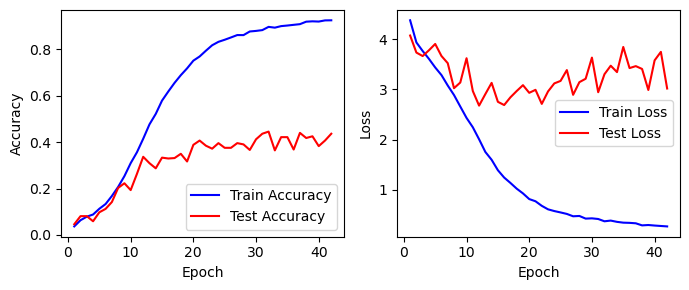

In [132]:
visualize_history_metrics(history_cnn2)

In [133]:
evaluate_model_cnn(model_cnn2,test_ds)

1/1 [==============================] - 0s 30ms/step
Precision: 0.47084544288845365
Recall: 0.4444444444444444
F1-score: 0.43255460181362115
Accuracy: 0.4444444444444444


In [64]:
model_cnn4 = Sequential()

# Convolutional layers with batch normalization and max pooling
model_cnn4.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3)))
model_cnn4.add(BatchNormalization())
model_cnn4.add(MaxPooling2D(2, 2))

model_cnn4.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model_cnn4.add(BatchNormalization())
model_cnn4.add(MaxPooling2D(2, 2))

model_cnn4.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model_cnn4.add(BatchNormalization())
model_cnn4.add(MaxPooling2D(2, 2))

model_cnn4.add(Conv2D(128, kernel_size=(3, 3), activation='leaky_relu'))
model_cnn4.add(BatchNormalization())
model_cnn4.add(MaxPooling2D(2, 2))

model_cnn4.add(Conv2D(128, kernel_size=(3, 3), activation='leaky_relu'))
model_cnn4.add(BatchNormalization())
model_cnn4.add(MaxPooling2D(2, 2))

# Flatten the feature maps
model_cnn4.add(Flatten())

# Dense layers with dropout
model_cnn4.add(Dense(1024, activation='relu'))
model_cnn4.add(Dropout(0.5))

model_cnn4.add(Dense(512, activation='relu'))
model_cnn4.add(Dropout(0.5))

# Output layer
model_cnn4.add(Dense(len(class_names), activation='softmax'))

# Compile the model
model_cnn4.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_cnn4.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 148, 148, 64)      1792      
                                                                 
 batch_normalization_54 (Bat  (None, 148, 148, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 74, 74, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_49 (Conv2D)          (None, 72, 72, 64)        36928     
                                                                 
 batch_normalization_55 (Bat  (None, 72, 72, 64)       256       
 chNormalization)                                                
                                                      

In [65]:
history_cnn4 = model_cnn4.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50


550/550 [==============================] - 29s 50ms/step - loss: 4.1030 - accuracy: 0.0559 - val_loss: 3.9379 - val_accuracy: 0.0534
Epoch 2/50
550/550 [==============================] - 26s 47ms/step - loss: 3.6428 - accuracy: 0.0976 - val_loss: 3.4857 - val_accuracy: 0.0921
Epoch 3/50
550/550 [==============================] - 27s 49ms/step - loss: 3.4024 - accuracy: 0.1355 - val_loss: 3.4657 - val_accuracy: 0.1381
Epoch 4/50
550/550 [==============================] - 26s 48ms/step - loss: 3.1426 - accuracy: 0.1745 - val_loss: 3.2965 - val_accuracy: 0.1639
Epoch 5/50
550/550 [==============================] - 26s 48ms/step - loss: 2.8760 - accuracy: 0.2257 - val_loss: 3.4877 - val_accuracy: 0.1400
Epoch 6/50
550/550 [==============================] - 28s 51ms/step - loss: 2.6256 - accuracy: 0.2733 - val_loss: 3.4926 - val_accuracy: 0.1621
Epoch 7/50
550/550 [==============================] - 27s 48ms/step - loss: 2.3607 - accuracy: 0.3326 - val_loss: 3.1164 - val_accuracy: 0.2155
Epo

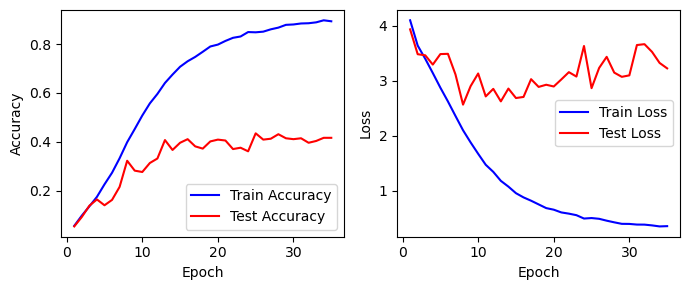

In [66]:
visualize_history_metrics(history_cnn4)

In [67]:
evaluate_model_cnn(model_cnn4,test_ds)

1/1 [==============================] - 0s 454ms/step
Precision: 0.45637722492561206
Recall: 0.4229390681003584
F1-score: 0.40992349059872873
Accuracy: 0.4229390681003584


- CNN Hyperparameters Tuning

In [13]:
X_train_cnn = np.concatenate([x for x, _ in train_ds], axis=0)
y_train_cnn = np.concatenate([y for _, y in train_ds], axis=0)
X_val_cnn = np.concatenate([x for x, _ in val_ds], axis=0)
y_val_cnn = np.concatenate([y for _, y in val_ds], axis=0)

In [15]:
# Define the model-building function
def build_model_cnn_tune(hp):
    model = Sequential()
    model.add(Conv2D(filters=hp.Int('conv_1_filters', min_value=16, max_value=64, step=32),
                     kernel_size=(3, 3),
                     activation=hp.Choice('conv_1_activation', values=['relu','leaky_relu']),
                     input_shape=(150,150,3)))
    model.add(MaxPooling2D(2,2))

    model.add(Conv2D(filters=hp.Int('conv_2_filters', min_value=32, max_value=96, step=32),
                     kernel_size=(3, 3),
                     activation=hp.Choice('conv_2_activation', values=['relu','leaky_relu'])))
    model.add(MaxPooling2D(2,2))

    model.add(Conv2D(filters=hp.Int('conv_3_filters', min_value=96, max_value=168, step=32),
                     kernel_size=(3, 3),
                     activation=hp.Choice('conv_3_activation', values=['relu','leaky_relu'])))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(2,2))
    model.add(Dropout(0.25))
    
    model.add(Flatten())

    model.add(Dense(units=hp.Int('dense_1_units', min_value=256, max_value=512, step=64),
                    activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(rate=hp.Float('dropout_1', min_value=0.2, max_value=0.5, step=0.1)))

    model.add(Dense(len(class_names), activation='softmax'))

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy',metrics=['accuracy'])

    return model

# Instantiate the random search tuner
tuner_cnn = RandomSearch(
    build_model_cnn_tune,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=1,
    directory='cnn_hp_tuning',
    project_name='cnn_tuner')

# Perform the hyperparameter search
tuner_cnn.search(train_ds, validation_data=val_ds, epochs=10)

# Get the best hyperparameters
best_hps_cnn = tuner_cnn.get_best_hyperparameters(num_trials=1)[0]

Trial 10 Complete [00h 03m 36s]
val_accuracy: 0.2154696136713028

Best val_accuracy So Far: 0.23756906390190125
Total elapsed time: 00h 37m 39s
INFO:tensorflow:Oracle triggered exit


In [17]:
model_cnn_tune = tuner_cnn.hypermodel.build(best_hps_cnn)

history_cnn_tune = model_cnn_tune.fit(train_ds, validation_data=val_ds, 
                                      epochs=50,
                                      callbacks=[early_stopping])

Epoch 1/50
550/550 [==============================] - 18s 31ms/step - loss: 7.4146 - accuracy: 0.0367 - val_loss: 5.8519 - val_accuracy: 0.0442
Epoch 2/50
550/550 [==============================] - 17s 30ms/step - loss: 5.3871 - accuracy: 0.0625 - val_loss: 5.6799 - val_accuracy: 0.0755
Epoch 3/50
550/550 [==============================] - 17s 30ms/step - loss: 5.4810 - accuracy: 0.0808 - val_loss: 5.2719 - val_accuracy: 0.0958
Epoch 4/50
550/550 [==============================] - 16s 30ms/step - loss: 5.3506 - accuracy: 0.1161 - val_loss: 5.7276 - val_accuracy: 0.1013
Epoch 5/50
550/550 [==============================] - 17s 30ms/step - loss: 5.6925 - accuracy: 0.1560 - val_loss: 6.0117 - val_accuracy: 0.1473
Epoch 6/50
550/550 [==============================] - 17s 31ms/step - loss: 6.0010 - accuracy: 0.2044 - val_loss: 6.6945 - val_accuracy: 0.1842
Epoch 7/50
550/550 [==============================] - 17s 31ms/step - loss: 6.3670 - accuracy: 0.2482 - val_loss: 7.3165 - val_accuracy:

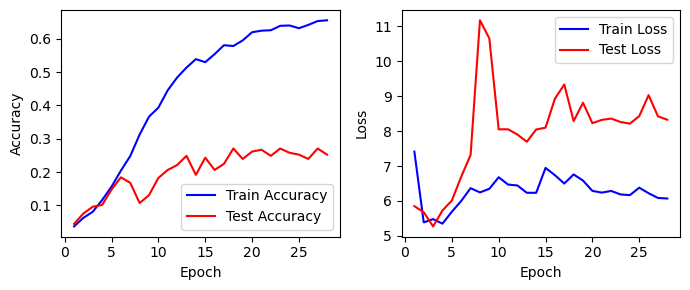

In [20]:
visualize_history_metrics(history_cnn_tune)

In [21]:
evaluate_model_cnn(model_cnn_tune,test_ds)

1/1 [==============================] - 0s 262ms/step
Precision: 0.3139117446142308
Recall: 0.2921146953405018
F1-score: 0.27533887690214065
Accuracy: 0.2921146953405018


### 3.3 CNN Pre-trained model (Xception)

In [15]:
from keras.applications import Xception
from keras.models import Model
from keras.optimizers import Adam, RMSprop
from keras.layers import Flatten, Dense, Dropout, GlobalAveragePooling2D
from keras.regularizers import l2

- Xception base model

In [21]:
base_model_xct1 = Xception(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Add custom classification layers on top of the base model
x = Flatten()(base_model_xct1.output)
x = Dense(256, activation='relu')(x)
output = Dense(80, activation='softmax')(x)  # num_classes is the number of output classes

model_xct1 = Model(inputs=base_model_xct1.input, outputs=output)

model_xct1.compile(optimizer=Adam(lr=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model_xct1.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 74, 74, 32)   864         ['input_3[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 74, 74, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                            

In [22]:
history_xct1 = model_xct1.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10)

Epoch 1/10
550/550 [==============================] - 123s 212ms/step - loss: 3.0458 - accuracy: 0.2390 - val_loss: 1.9679 - val_accuracy: 0.4530
Epoch 2/10
550/550 [==============================] - 123s 223ms/step - loss: 1.0611 - accuracy: 0.6731 - val_loss: 1.6052 - val_accuracy: 0.5654
Epoch 3/10
550/550 [==============================] - 122s 222ms/step - loss: 0.5787 - accuracy: 0.8176 - val_loss: 1.4779 - val_accuracy: 0.6188
Epoch 4/10
550/550 [==============================] - 122s 221ms/step - loss: 0.3750 - accuracy: 0.8819 - val_loss: 1.3752 - val_accuracy: 0.6501
Epoch 5/10
550/550 [==============================] - 125s 226ms/step - loss: 0.2942 - accuracy: 0.9094 - val_loss: 1.3865 - val_accuracy: 0.6924
Epoch 6/10
550/550 [==============================] - 122s 222ms/step - loss: 0.2175 - accuracy: 0.9330 - val_loss: 1.7206 - val_accuracy: 0.6611
Epoch 7/10
550/550 [==============================] - 126s 230ms/step - loss: 0.2150 - accuracy: 0.9338 - val_loss: 2.1446 -

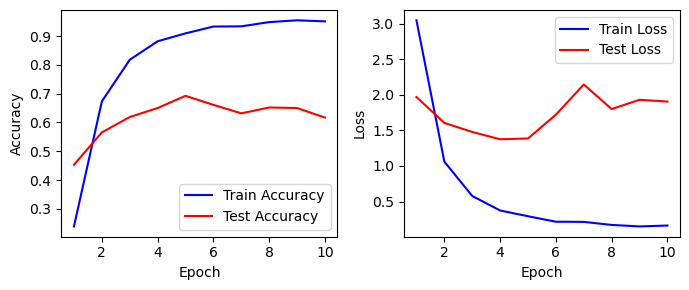

In [25]:
visualize_history_metrics(history_xct1)

In [43]:
evaluate_model_cnn(model_xct1,test_ds)

1/1 [==============================] - 0s 54ms/step
Precision: 0.726763591493193
Recall: 0.6451612903225806
F1-score: 0.645091585854916
Accuracy: 0.6451612903225806


- Xception Manual Improvement

In [55]:
base_model_xct2 = Xception(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

x = base_model_xct2.output
x = Conv2D(256, (3, 3), activation='relu')(x)
x = GlobalAveragePooling2D()(x)  
x = Dense(512, activation='relu')(x)  
x = BatchNormalization()(x) 
x = Dropout(0.5)(x)  
x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(x)  
x = BatchNormalization()(x) 
output = Dense(80, activation='softmax')(x)  

model_xct2 = Model(inputs=base_model_xct2.input, outputs=output)

model_xct2.compile(optimizer=Adam(lr=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model_xct2.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 74, 74, 32)   864         ['input_8[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 74, 74, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                            

In [56]:
history_xct2 = model_xct2.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10)

Epoch 1/10
550/550 [==============================] - 135s 227ms/step - loss: 3.0280 - accuracy: 0.2918 - val_loss: 2.7290 - val_accuracy: 0.3886
Epoch 2/10
550/550 [==============================] - 129s 235ms/step - loss: 1.3313 - accuracy: 0.6612 - val_loss: 1.8906 - val_accuracy: 0.5635
Epoch 3/10
550/550 [==============================] - 130s 236ms/step - loss: 0.8383 - accuracy: 0.7964 - val_loss: 1.4981 - val_accuracy: 0.6409
Epoch 4/10
550/550 [==============================] - 129s 235ms/step - loss: 0.5941 - accuracy: 0.8654 - val_loss: 1.6729 - val_accuracy: 0.6390
Epoch 5/10
550/550 [==============================] - 129s 234ms/step - loss: 0.4842 - accuracy: 0.8925 - val_loss: 1.5562 - val_accuracy: 0.6796
Epoch 6/10
550/550 [==============================] - 128s 232ms/step - loss: 0.3950 - accuracy: 0.9159 - val_loss: 2.8060 - val_accuracy: 0.5083
Epoch 7/10
550/550 [==============================] - 128s 233ms/step - loss: 0.3569 - accuracy: 0.9244 - val_loss: 1.2954 -

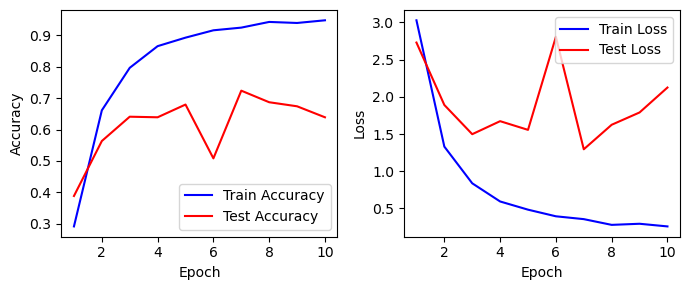

In [57]:
visualize_history_metrics(history_xct2)

In [58]:
evaluate_model_cnn(model_xct2, test_ds)

1/1 [==============================] - 1s 1s/step
Precision: 0.7298993428717179
Recall: 0.6397849462365591
F1-score: 0.6392043033303532
Accuracy: 0.6397849462365591


- Xception Hyperparameters Tuning

In [16]:
base_model_xct3 = Xception(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

def build_model_xct(hp):
    # Define the hyperparameters to tune
    hp_units = hp.Int('units', min_value=64, max_value=512, step=64)
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    # Add custom classification layers on top of the base model
    x = Flatten()(base_model_xct3.output)
    x = Dense(units=hp_units, activation='relu')(x)
    output = Dense(80, activation='softmax')(x)

    # Create the model
    model = Model(inputs=base_model_xct3.input, outputs=output)

    # Compile the model with hyperparameters
    model.compile(optimizer=Adam(learning_rate=hp_learning_rate),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Instantiate the tuner
tuner_xct = RandomSearch(
    build_model_xct,
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=1,
    directory='xception_hyperparameter_tuning',
    project_name='xception_tuner')

# Search for the best hyperparameter configuration
tuner_xct.search(train_ds,
             validation_data=val_ds,
             epochs=10,
             callbacks=[EarlyStopping(monitor='val_accuracy', patience=2)])

# Get the best hyperparameters
best_hps_xct = tuner_xct.get_best_hyperparameters(num_trials=1)[0]

Trial 5 Complete [00h 08m 54s]
val_accuracy: 0.37569060921669006

Best val_accuracy So Far: 0.8047882318496704
Total elapsed time: 00h 55m 08s
INFO:tensorflow:Oracle triggered exit


In [18]:
model_xct_tune = tuner_xct.hypermodel.build(best_hps_xct)

history_xct_tune = model_xct_tune.fit(train_ds, validation_data=val_ds, 
                                      epochs=10)

Epoch 1/10
550/550 [==============================] - 148s 259ms/step - loss: 1.4738 - accuracy: 0.6396 - val_loss: 2.7709 - val_accuracy: 0.3794
Epoch 2/10
550/550 [==============================] - 139s 253ms/step - loss: 0.4198 - accuracy: 0.8875 - val_loss: 2.9660 - val_accuracy: 0.3702
Epoch 3/10
550/550 [==============================] - 138s 251ms/step - loss: 0.1997 - accuracy: 0.9503 - val_loss: 3.1575 - val_accuracy: 0.3923
Epoch 4/10
550/550 [==============================] - 137s 250ms/step - loss: 0.1262 - accuracy: 0.9705 - val_loss: 3.4497 - val_accuracy: 0.3849
Epoch 5/10
550/550 [==============================] - 133s 242ms/step - loss: 0.0754 - accuracy: 0.9849 - val_loss: 3.5844 - val_accuracy: 0.3794
Epoch 6/10
550/550 [==============================] - 132s 239ms/step - loss: 0.0593 - accuracy: 0.9859 - val_loss: 3.7396 - val_accuracy: 0.3923
Epoch 7/10
550/550 [==============================] - 126s 230ms/step - loss: 0.0485 - accuracy: 0.9899 - val_loss: 3.9438 -

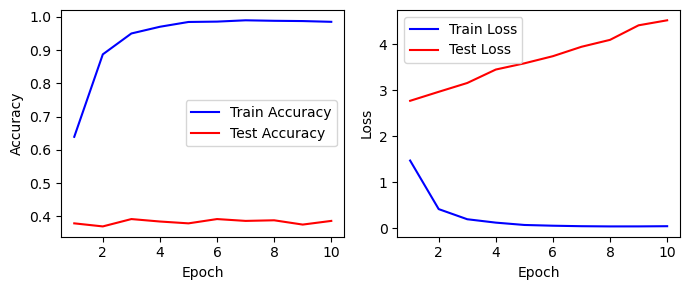

In [21]:
visualize_history_metrics(history_xct_tune)

In [22]:
evaluate_model_cnn(model_xct_tune,test_ds)

1/1 [==============================] - 1s 1s/step
Precision: 0.4261979725887063
Recall: 0.3888888888888889
F1-score: 0.38427019587825756
Accuracy: 0.3888888888888889
